# Flag QC-failed imaging wells 

In [2]:
# Imports
import os
import warnings
import numpy as np
import polars as pl
import pandas as pd
from tqdm import tqdm
import statsmodels.formula.api as smf
from scipy.stats import ttest_rel
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

PLATEMAP_DIR = "../../../1_inputs/1_snakemake_pipeline/inputs/metadata/platemaps/{batch_id}/platemap"
IMGS_QC_DIR = "../../../3_outputs/1_snakemake_pipeline/1.image_well_qc_results" ## plate_bg_summary

# PROF_DIR = "../../../8.2_updated_snakemake_pipeline/outputs/batch_profiles"
# CLASS_RES_DIR = "../../../8.2_updated_snakemake_pipeline/outputs/classification_results"
# TIFF_IMGS_DIR = "../../../8.1_upstream_analysis_runxi/2.raw_img_qc/inputs/images"

from plot_utils import *
letter_dict_rev = {v: k for k, v in letter_dict.items()}
channel_dict_rev = {v: k for k, v in channel_dict.items()}

# letter_dict_rev
channel_list = list(channel_dict_rev.values())[:-3]
channel_list

['DAPI', 'GFP', 'AGP', 'Mito']

In [3]:
BIO_REP_BATCHES = ["2025_01_27_Batch_13", "2025_01_28_Batch_14"]
COMBINED_BIO_REP_DIR = "2025_01_Batch_13-14"
OUTPUT_DIR = f"../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/1.image_qc_outputs/{COMBINED_BIO_REP_DIR}"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

## 1. Read the Results

In [4]:
def get_plate_well_sum(batch, img_qc_dir, output_dir, write_pq=False):
    plate_sum = pl.read_parquet(f"{img_qc_dir}/{batch}/plate_sum_stats.parquet")
    plate_well_sum = pl.read_parquet(f"{img_qc_dir}/{batch}/plate_well_sum_stats.parquet")
    # plate_site_sum = pl.read_parquet(f"../outputs/1.plate_bg_summary/{batch}/plate_site_channel.parquet")
    # plate_site_sum = plate_site_sum.filter(~(pl.col("channel").str.contains("Brightfield"))).sort(by=["plate","well"]).join(plate_sum, on=["plate","channel"], how="left", suffix="_plate")

    # plate_well_sum.filter(~(pl.col("channel").str.contains("Brightfield"))).sort(by=["plate","well"])
    plate_well_sum = plate_well_sum.filter(
        ~(pl.col("channel").str.contains("Brightfield"))
    ).join(
        plate_sum.rename({"perc_50": "median_plate"}), on=["plate","channel"], how="left", suffix="_plate"
    ).sort(by=["plate","well"])

    plates = sorted(plate_well_sum["plate"].unique())
    plate_well_sum_with_metrics = pl.DataFrame()
    for plate in plates: #plate_well_sum.group_by("plate"):
        group = plate_well_sum.filter(pl.col("plate")==plate)
        # plate = group[0][0]
        fig, axes = plt.subplots(1, 4, figsize=(15, 3))
        for channel in channel_list:
            # print(plate, channel)
            plate_channel_plate = plate_well_sum.filter(
                (pl.col("plate")==plate)&(pl.col("channel")==channel)
            ).with_columns(
                (pl.col("perc_99") / pl.col("perc_25")).alias("s2n_ratio")
            ).filter(
                (~(pl.col("s2n_ratio").is_infinite()))&(~(pl.col("s2n_ratio").is_nan()))
            ).sort(by="s2n_ratio")
            if channel == "GFP":
                plate_channel_plate = plate_channel_plate.with_columns(
                    np.log10(pl.col("s2n_ratio")+1e-4).alias("s2n_ratio")
                )
            sns.histplot(plate_channel_plate["s2n_ratio"], ax=axes[channel_list.index(channel)], bins=100) # log_scale=True
            s2n_ratios = plate_channel_plate["s2n_ratio"].to_numpy()
            counts, edges = np.histogram(s2n_ratios, bins=50)
            # 4) the right edge of the first bin is our cutoff
            threshold = edges[1]
            plate_channel_plate = plate_channel_plate.with_columns(
                pl.lit(threshold).alias("s2n_threshold"),
                (pl.col("s2n_ratio") <= threshold).alias("is_bg")
            )
            axes[channel_list.index(channel)].axvline(threshold, color='red', linestyle='--', label='Threshold')
            if channel == "GFP":
                axes[channel_list.index(channel)].set_xlabel("log10(s2n_ratio)")
            else:
                axes[channel_list.index(channel)].set_xlabel("s2n_ratio")
            axes[channel_list.index(channel)].set_title(channel)

            plate_well_sum_with_metrics = pl.concat([plate_well_sum_with_metrics, plate_channel_plate])

        fig.suptitle(f"{plate}",y=1.05)
        fig.subplots_adjust(wspace=0.25)

    output_pq_file = f"{output_dir}/{batch}/plate_well_sum_with_qc_metrics.parquet"
    # display(plate_well_sum_with_metrics)
    if os.path.exists(output_pq_file):
        print("Output exists at:", output_pq_file)
        return plate_well_sum_with_metrics
        
    if write_pq:
        os.makedirs(f"{output_dir}/{batch}")
        print("Writed outputs at:", output_pq_file)
        plate_well_sum_with_metrics.write_parquet(
            output_pq_file
        )
        return plate_well_sum_with_metrics

Output exists at: ../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/1.image_qc_outputs/2025_01_Batch_13-14/2025_01_27_Batch_13/plate_well_sum_with_qc_metrics.parquet
Output exists at: ../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/1.image_qc_outputs/2025_01_Batch_13-14/2025_01_28_Batch_14/plate_well_sum_with_qc_metrics.parquet


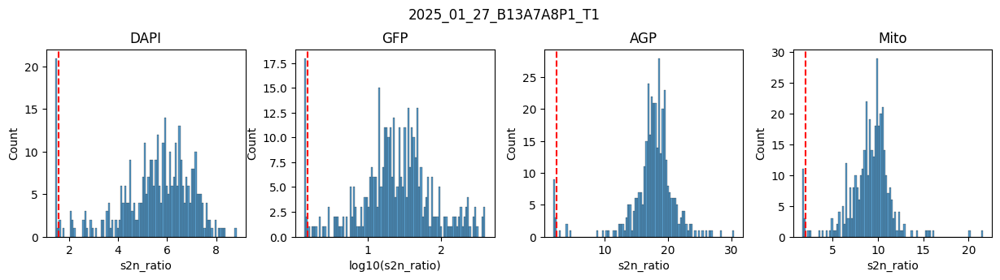

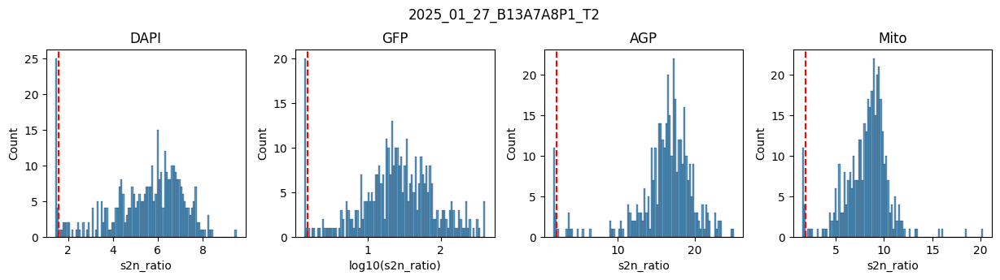

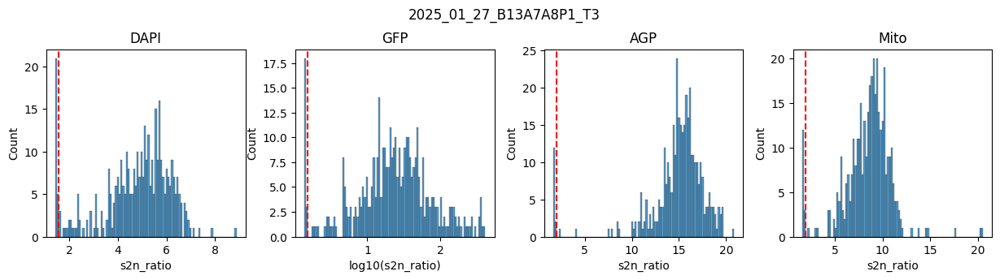

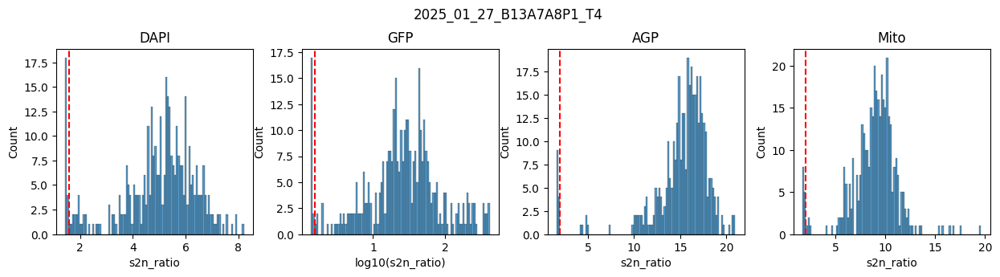

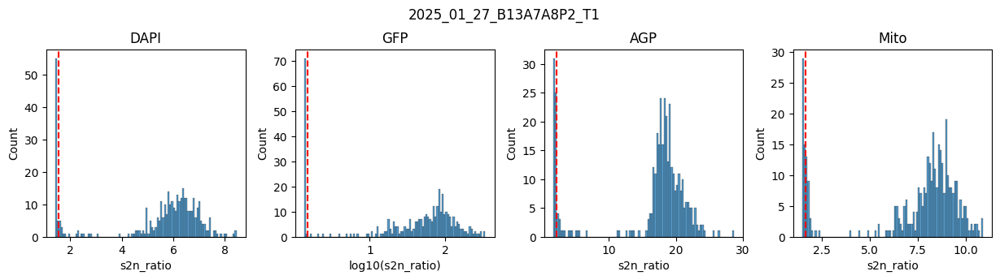

...

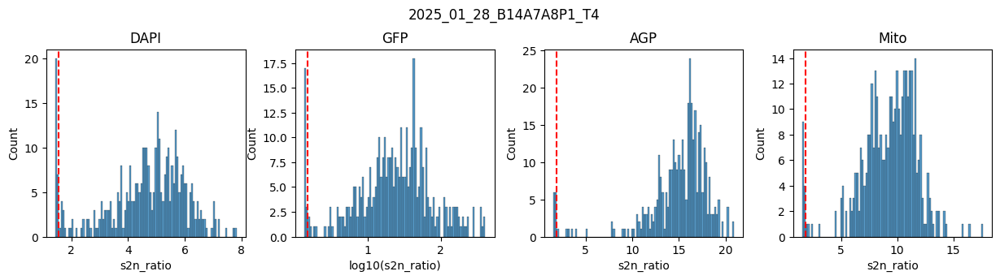

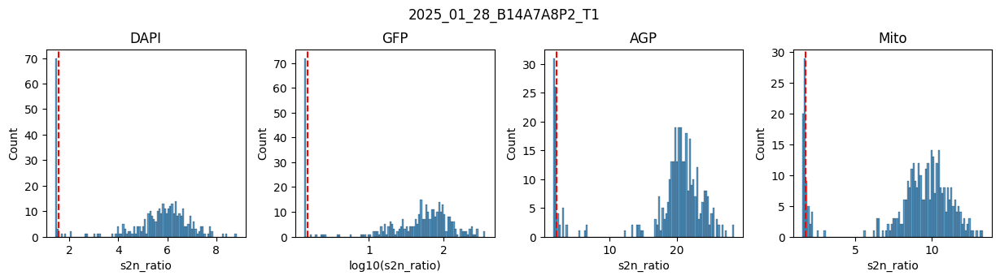

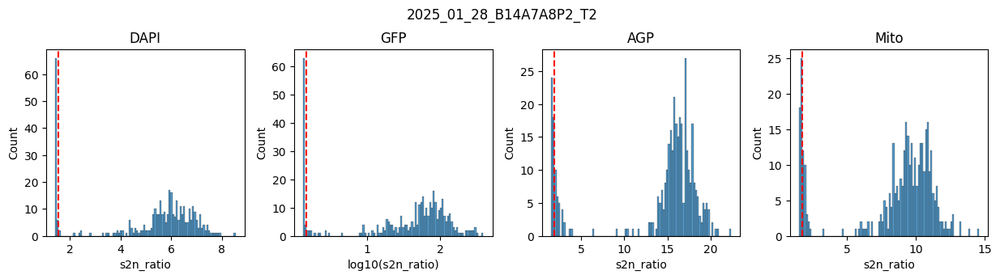

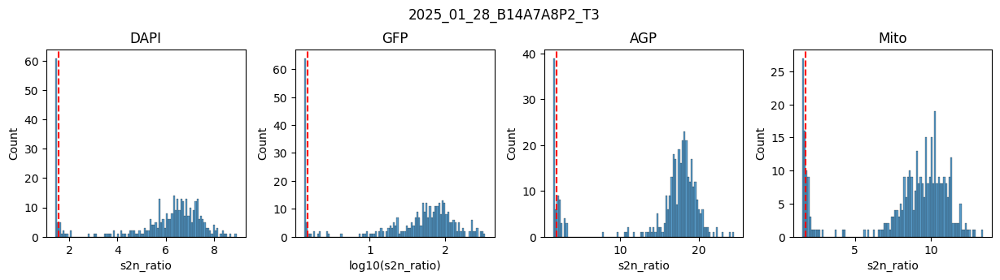

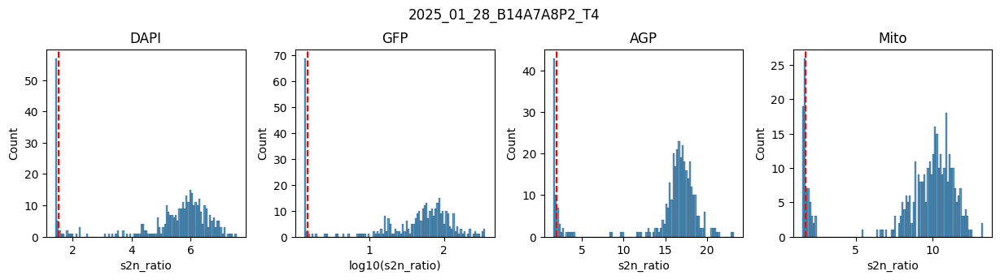

In [5]:
for batch in BIO_REP_BATCHES:
    plate_well_sum_with_metrics = get_plate_well_sum(batch, IMGS_QC_DIR, OUTPUT_DIR, write_pq=True)

## 2. Label Poor-Quality Imaging Wells

In [7]:
allele_meta_dict = {}
for batch_id in BIO_REP_BATCHES:
    allele_meta_df = pl.DataFrame()
    for platemap in os.listdir(PLATEMAP_DIR.format(batch_id=batch_id)):
        platemap_df = pl.read_csv(os.path.join(PLATEMAP_DIR.format(batch_id=batch_id), platemap), separator="\t", infer_schema_length=100000)
        allele_meta_df = pl.concat([allele_meta_df, 
                                    platemap_df.filter((pl.col("node_type").is_not_null()))], # (~pl.col("node_type").is_in(["TC","NC","PC"]))&
                                    how="diagonal_relaxed").sort("plate_map_name")
        allele_meta_df = allele_meta_df.with_columns(pl.col("plate_map_name").str.split('_').list.get(0).alias("plate_map"))
    allele_meta_dict[batch_id] = allele_meta_df

In [ ]:
img_well_qc_sum, well_agg_allele_qc_sum = pl.DataFrame(), pl.DataFrame()

for batch_id in BIO_REP_BATCHES:
    plate_img_qc = pl.read_parquet(f"{OUTPUT_DIR}/{batch_id}/plate_well_sum_with_qc_metrics.parquet")
    ## map the plate_well together
    plate_img_qc = plate_img_qc.with_columns(
        pl.col("plate").str.split('_').list.get(-2).alias("plate_id")
    ).with_columns(
        pl.concat_str([pl.col("plate_id"),pl.col("well")], separator="-").alias("plate_well")
    )
    allele_meta_df = allele_meta_dict[batch_id].with_columns(
        pl.concat_str([pl.col("plate_map"), pl.col("well_position")], separator="-").alias("plate_well")
    ).drop("plate","plate_map")
    # display(allele_meta_df)
    plate_img_qc = plate_img_qc.join(
        allele_meta_df, 
        on="plate_well", how="left"
    ).filter(
        (pl.col("gene_allele").is_not_null())
    )
    img_well_qc_sum = pl.concat([img_well_qc_sum, plate_img_qc], how="diagonal_relaxed")
    
    for channel in channel_list:
        plate_img_qc_ch = plate_img_qc.filter(pl.col("channel")==channel)
        plate_maps = sorted(plate_img_qc_ch["plate_map_name"].unique())
        # print(plate_maps)

        for plate_map in plate_maps:
            plate_img_qc_ch_pm = plate_img_qc_ch.filter(pl.col("plate_map_name")==plate_map)
            plates = sorted(plate_img_qc_ch_pm["plate"].unique().to_list())
            # print(plates)
            plot_platemap(
                plate_img_qc_ch_pm.filter(pl.col("plate")==plates[0]),
                plates[0]+f"_{channel}",
                well_pos_col="well",
                # this is the column to color by (categorical or continuous)
                value_col="node_type",
                # these columns will be concatenated into the annotation text
                label_cols=("gene_allele",),
                value_type="categorical",   # or "continuous"
                continuous_cmap="vlag",  # matplotlib colormap for continuous mode
                # categorical_colors={True: "tomato", False: "skyblue"},     # dict for categorical → color
                grid_square=None
            )
            break
            fig, axes = plt.subplots(2,2,figsize=(44,23)) ## sharey=True,sharex=True
            for plate in plates:
                plate_info = plate_img_qc_ch_pm.filter(pl.col("plate")==plate)
                # display(plate_info.filter(pl.col("is_bg")))
                # print(plates.index(plate))
                plot_platemap(
                    plate_info,
                    plate+f"_{channel}",
                    well_pos_col="well",
                    # this is the column to color by (categorical or continuous)
                    value_col="is_bg",
                    # these columns will be concatenated into the annotation text
                    label_cols=("gene_allele",),
                    ax=axes[plates.index(plate)//2, plates.index(plate)%2],
                    value_type="categorical",   # or "continuous"
                    continuous_cmap="vlag",  # matplotlib colormap for continuous mode
                    categorical_colors={True: "tomato", False: "skyblue"},     # dict for categorical → color
                    grid_square=None
                )
            fig.subplots_adjust(wspace=-.61, hspace=.05)
            plt.tight_layout()
            break
        
        well_img_qc_ch_sum_batch = plate_img_qc_ch.group_by(["gene_allele","well"]).agg(
            pl.col("is_bg").sum().alias("is_bg_sum"),
        ).with_columns(
            pl.lit(batch_id).alias("Batch"),
            pl.when(pl.col("is_bg_sum")>=3)
            .then(pl.lit("FAIL"))
            .otherwise(pl.lit("PASS"))
            .alias("QC_Flag")
        )
        well_agg_allele_qc_sum = pl.concat([well_agg_allele_qc_sum, well_img_qc_ch_sum_batch])

In [10]:
plate_img_qc_ch_pm

plate,well,channel,mean,std,perc_25,perc_50,perc_75,perc_80,perc_90,perc_95,perc_99,mean_plate,std_plate,perc_25_plate,median_plate,perc_75_plate,perc_80_plate,perc_90_plate,perc_95_plate,perc_99_plate,s2n_ratio,s2n_threshold,is_bg,plate_id,plate_well,plate_map_name,well_position,symbol,gene_allele,imaging_well,imaging_plate_R1,imaging_plate_R2,node_type,orf_id_wt,ccsb_mutation_id,nt_change_cdna,aa_change,allele_set,imaging_plate,batch1,batch2,clone_ID,hgmd_ID,clinvar_allele_ID,clinvar_clinical_significance,vector,notes,quad,c96,r96,r384,c384,r384_letter
str,str,str,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,bool,str,str,str,str,str,str,str,str,str,str,f64,str,str,str,f64,f64,f64,f64,str,str,str,str,f64,str,i64,i64,i64,i64,i64,str
"""2025_01_28_B14A7A8P1_T1""","""J08""","""Mito""",497.671419,117.682291,437,508,563,573,596,614,664,737.691395,857.44179,459,548,641,672,1132,2037,4337,1.519451,1.816014,true,"""B14A7A8P1""","""B14A7A8P1-J08""","""B14A7A8P1_R2""","""J08""","""MSH2""","""MSH2_Leu173Arg""","""J08""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7918.0,"""CCSBVarC010941""","""518T>G""","""Leu173Arg""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,4,5,10,8,"""J"""
"""2025_01_28_B14A7A8P1_T1""","""J12""","""Mito""",488.75348,184.172501,427,494,548,558,582,601,669,737.691395,857.44179,459,548,641,672,1132,2037,4337,1.566745,1.816014,true,"""B14A7A8P1""","""B14A7A8P1-J12""","""B14A7A8P1_R2""","""J12""","""NF2""","""NF2_Thr189Ile""","""J12""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",3697.0,"""CCSBVarC016643""","""566C>T""","""Thr189Ile""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,6,5,10,12,"""J"""
"""2025_01_28_B14A7A8P1_T1""","""D09""","""Mito""",464.976758,154.872394,401,473,532,544,571,591,638,737.691395,857.44179,459,548,641,672,1132,2037,4337,1.591022,1.816014,true,"""B14A7A8P1""","""B14A7A8P1-D09""","""B14A7A8P1_R2""","""D09""","""G6PD""","""G6PD_Phe88Leu""","""D09""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",4006.0,"""CCSBVarC021451""","""264C>G""","""Phe88Leu""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,3,5,2,4,9,"""D"""
"""2025_01_28_B14A7A8P1_T1""","""C11""","""Mito""",439.379419,180.91312,378,446,500,510,534,556,605,737.691395,857.44179,459,548,641,672,1132,2037,4337,1.600529,1.816014,true,"""B14A7A8P1""","""B14A7A8P1-C11""","""B14A7A8P1_R2""","""C11""","""BRCA1""","""BRCA1_Tyr179Cys""","""C11""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",14613.0,"""CCSBVarC002122""","""536A>G""","""Tyr179Cys""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,6,2,3,11,"""C"""
"""2025_01_28_B14A7A8P1_T1""","""H06""","""Mito""",497.086636,116.032352,429,509,572,585,616,638,688,737.691395,857.44179,459,548,641,672,1132,2037,4337,1.60373,1.816014,true,"""B14A7A8P1""","""B14A7A8P1-H06""","""B14A7A8P1_R2""","""H06""","""MSH2""","""MSH2_Leu187Arg""","""H06""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7918.0,"""CCSBVarC010860""","""560T>G""","""Leu187Arg""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,3,4,8,6,"""H"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""2025_01_28_B14A7A8P1_T4""","""H14""","""Mito""",824.931509,1674.213449,448,532,603,621,1043,2406,6386,737.23164,933.674826,439,529,624,658,1189,2161,4515,14.254464,1.85792,false,"""B14A7A8P1""","""B14A7A8P1-H14""","""B14A7A8P1_R2""","""H14""","""NF2""","""NF2_His479Arg""","""H14""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",3697.0,"""CCSBVarC016584""","""1436A>G""","""His479Arg""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,7,4,8,14,"""H"""
"""2025_01_28_B14A7A8P1_T4""","""E09""","""Mito""",1122.312316,1303.96849,439,563,1346,1676,2597,3593,6297,737.23164,933.674826,439,529,624,658,1189,2161,4515,14.343964,1.85792,false,"""B14A7A8P1""","""B14A7A8P1-E09""","""B14A7A8P1_R2""","""E09""","""BRAF""","""BRAF_Val600Gly""","""E09""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",71969.0,"""CCSBVarC0

In [9]:
well_agg_allele_qc_sum

gene_allele,well,is_bg_sum,Batch,QC_Flag
str,str,u32,str,str
"""CCM2_Glu108Lys""","""G22""",4,"""2025_01_27_Batch_13""","""FAIL"""
"""SDHD_Ser68Gly""","""I21""",0,"""2025_01_27_Batch_13""","""PASS"""
"""CCM2_Leu392Val""","""B23""",0,"""2025_01_27_Batch_13""","""PASS"""
"""SDHD_Arg70Thr""","""M21""",0,"""2025_01_27_Batch_13""","""PASS"""
"""CCM2_Tyr144Cys""","""L01""",0,"""2025_01_27_Batch_13""","""PASS"""
…,…,…,…,…
"""BAP1_Pro12Thr""","""I03""",0,"""2025_01_28_Batch_14""","""PASS"""
"""CCM2_Gly188Glu""","""N05""",0,"""2025_01_28_Batch_14""","""PASS"""
"""FARS2_Ile329Thr""","""D03""",0,"""2025_01_28_Batch_14""","""PASS"""


In [10]:
# well_agg_allele_qc_sum.write_csv(f"{OUTPUT_DIR}/allele-level_img_qc_sum.csv")
# img_well_qc_sum.write_csv(f"{OUTPUT_DIR}/plate-well-level_img_qc_sum.csv")

## 3. Visualize wells

In [4]:
well_agg_allele_qc_sum = pl.read_csv(f"{OUTPUT_DIR}/allele-level_img_qc_sum.csv")
img_well_qc_sum = pl.read_csv(f"{OUTPUT_DIR}/plate-well-level_img_qc_sum.csv")

In [5]:
TIFF_IMGS_DIR = "../../../2_analyses/1_snakemake_pipeline/2025_varchamp_snakemake/1.image_preprocess_qc/inputs/cpg_imgs"
OUT_IMGS_DIR = ""

<Figure size 640x480 with 0 Axes>

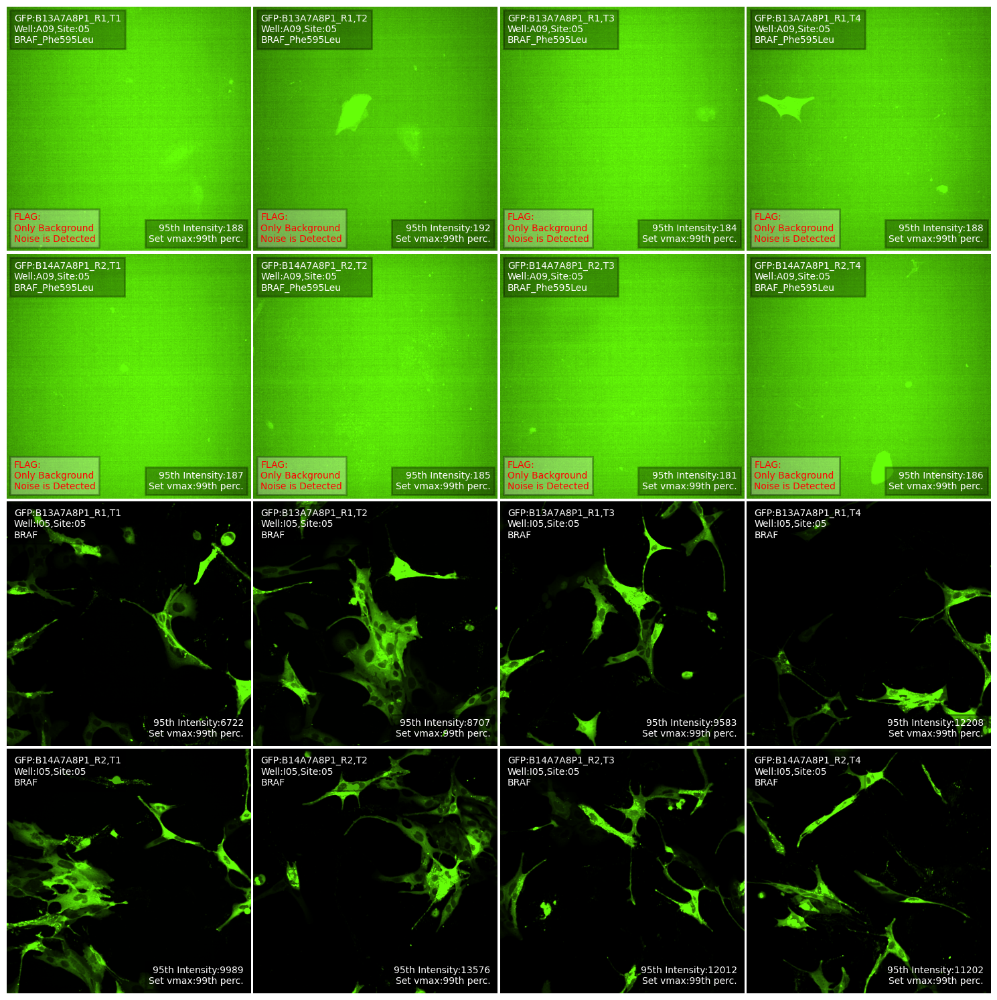

<Figure size 640x480 with 0 Axes>

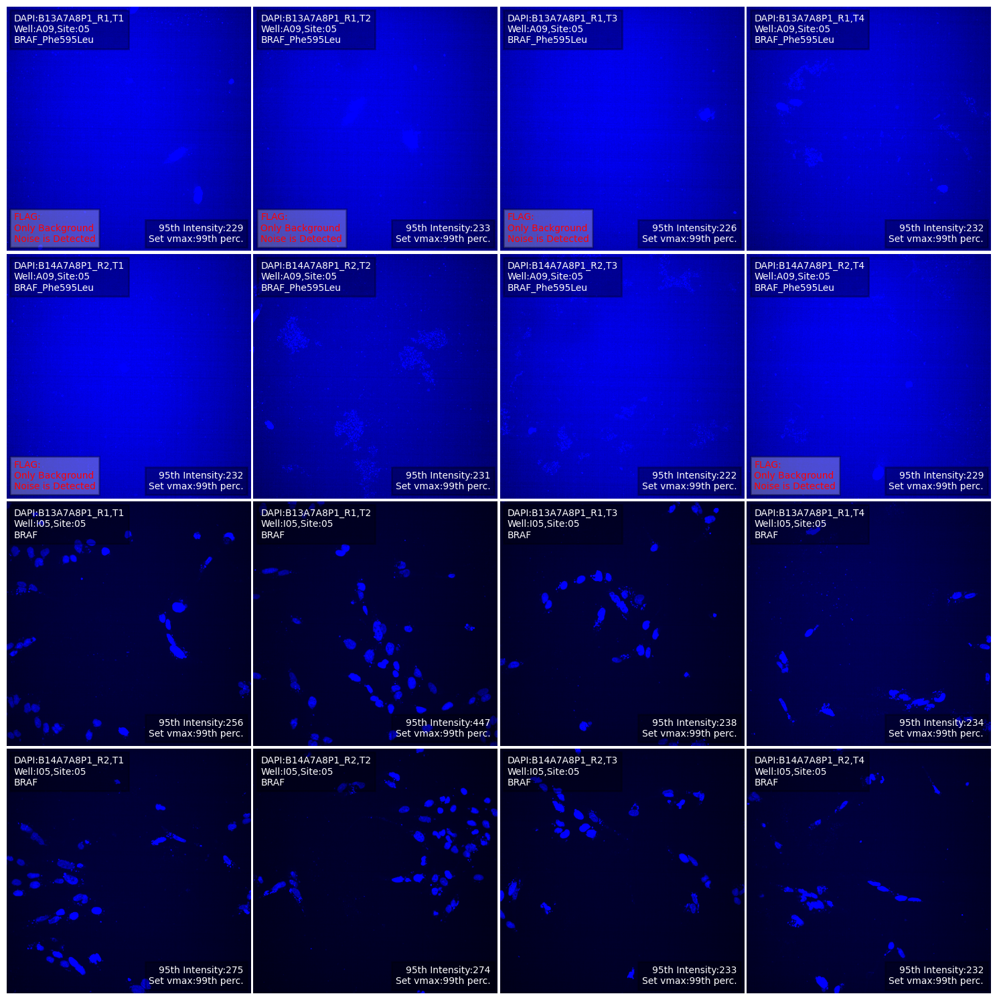

In [6]:
plot_allele(allele_meta_dict["2025_01_27_Batch_13"], "BRAF_Phe595Leu", "GFP", plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR)
plot_allele(allele_meta_dict["2025_01_27_Batch_13"], "BRAF_Phe595Leu", "DAPI", plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR)
# plot_allele(allele_meta_dict["2025_01_27_Batch_13"], "BRAF_Phe595Leu", "Mito", plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=True)
# plot_allele(allele_meta_dict["2025_01_27_Batch_13"], "BRAF_Phe595Leu", "AGP", plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=True)

<Figure size 640x480 with 0 Axes>

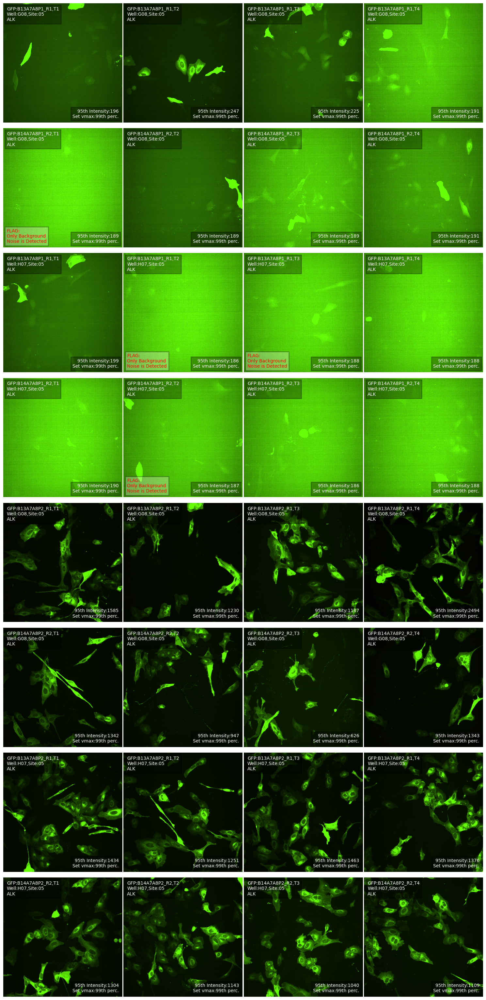

In [9]:
plot_allele(allele_meta_dict["2025_01_28_Batch_14"], "ALK", "GFP", ref_well=["G08"], var_well=["H07"], plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR)

<Figure size 640x480 with 0 Axes>

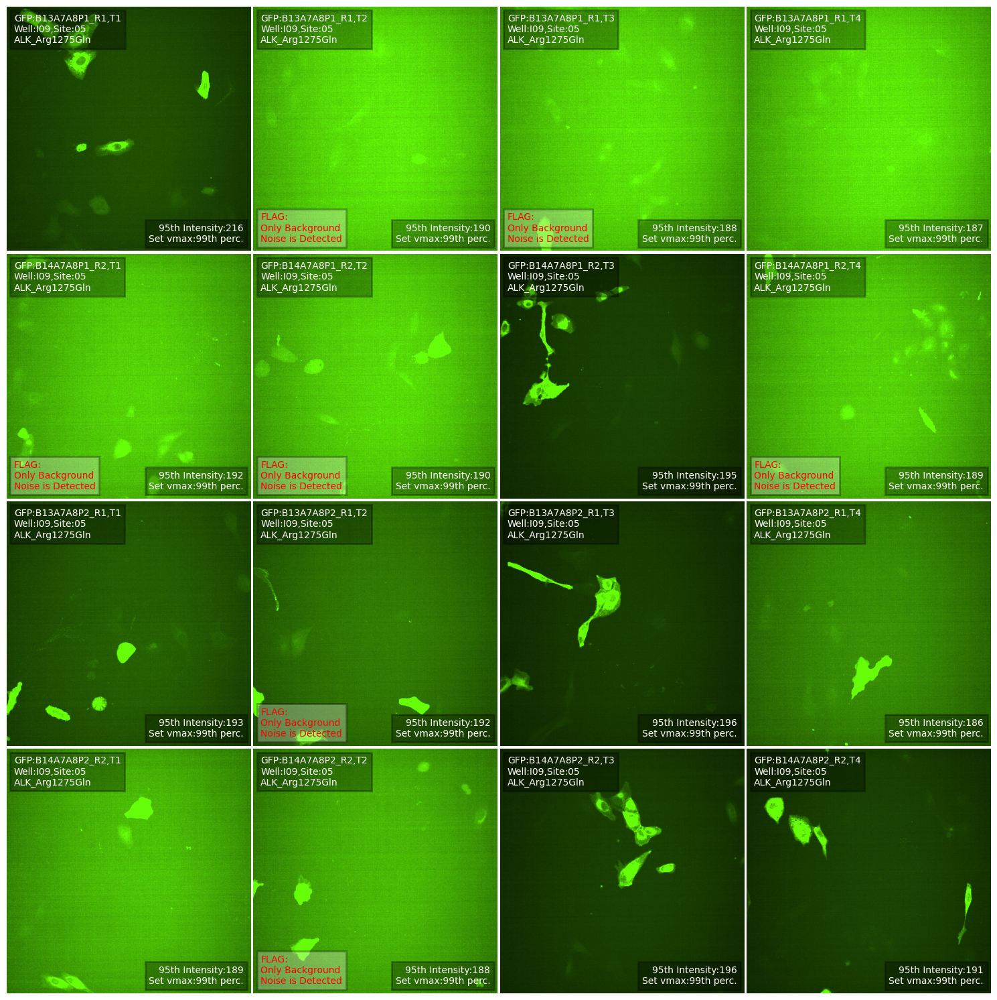

In [11]:
plot_allele(allele_meta_dict["2025_01_28_Batch_14"], "ALK_Arg1275Gln", "GFP", ref_well=["I10"], var_well=["I09"], plate_img_qc=img_well_qc_sum, site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR)

In [12]:
img_well_qc_sum.filter((pl.col("plate").str.contains("B14A7A8P1"))&(pl.col("gene_allele")=="ALK")&(pl.col("channel")=="GFP")&(pl.col("well")=="G08"))

plate,well,channel,mean,std,perc_25,perc_50,perc_75,perc_80,perc_90,perc_95,perc_99,mean_plate,std_plate,perc_25_plate,median_plate,perc_75_plate,perc_80_plate,perc_90_plate,perc_95_plate,perc_99_plate,s2n_ratio,s2n_threshold,is_bg,plate_id,plate_well,plate_map_name,well_position,symbol,gene_allele,imaging_well,imaging_plate_R1,imaging_plate_R2,node_type,orf_id_wt,ccsb_mutation_id,nt_change_cdna,aa_change,allele_set,imaging_plate,batch1,batch2,clone_ID,hgmd_ID,clinvar_allele_ID,clinvar_clinical_significance,vector,notes,quad,c96,r96,r384,c384,r384_letter
str,str,str,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,bool,str,str,str,str,str,str,str,str,str,str,f64,str,str,str,f64,f64,f64,f64,str,str,str,str,f64,str,i64,i64,i64,i64,i64,str
"""2025_01_28_B14A7A8P1_T1""","""G08""","""GFP""",161.144911,34.068028,145,161,175,178,186,191,206,483.770231,2620.860905,149,168,191,204,403,1081,6535,0.15253,0.185011,true,"""B14A7A8P1""","""B14A7A8P1-G08""","""B14A7A8P1_R2""","""G08""","""ALK""","""ALK""","""G08""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""PC""",null,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,2,4,4,7,8,"""G"""
"""2025_01_28_B14A7A8P1_T2""","""G08""","""GFP""",166.14421,108.356474,142,158,173,176,184,192,431,560.248418,2855.98529,149,169,202,235,588,1447,8039,0.482203,0.185994,false,"""B14A7A8P1""","""B14A7A8P1-G08""","""B14A7A8P1_R2""","""G08""","""ALK""","""ALK""","""G08""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""PC""",null,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,2,4,4,7,8,"""G"""
"""2025_01_28_B14A7A8P1_T3""","""G08""","""GFP""",163.465818,138.290383,141,156,170,173,180,187,445,567.346404,3059.260466,148,167,195,220,528,1344,8299,0.499155,0.185944,false,"""B14A7A8P1""","""B14A7A8P1-G08""","""B14A7A8P1_R2""","""G08""","""ALK""","""ALK""","""G08""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""PC""",null,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,2,4,4,7,8,"""G"""
"""2025_01_28_B14A7A8P1_T4""","""G08""","""GFP""",158.2928,38.782736,141,158,171,174,182,188,236,526.254412,2942.913618,147,166,188,201,415,1141,7566,0.223719,0.187162,false,"""B14A7A8P1""","""B14A7A8P1-G08""","""B14A7A8P1_R2""","""G08""","""ALK""","""ALK""","""G08""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""PC""",null,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,2,4,4,7,8,"""G"""
